In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from ipywidgets import widgets
import math
from utils import normal_psf, get_normal_psf_for_grid, create_and_save_psf, apply_psf
import plotly.graph_objects as go
from scipy.signal import fftconvolve, convolve2d
import cv2
import os

In [13]:
IMAGE_SIZE = (2048, 2048)

In [14]:
x_range = np.arange(-IMAGE_SIZE[0] // 2, IMAGE_SIZE[0] // 2)
y_range = np.arange(-IMAGE_SIZE[1] // 2, IMAGE_SIZE[1] // 2)

x, y = np.meshgrid(x_range, y_range)

grid = np.stack((x, y), axis=-1)

In [15]:
sigma_x = 100
sigma_y = 10
eta = 20
mean_x = 0
mean_y = 0

## Visualise the psf
The white dot exists but is very little so it is hard to see. It is in the middle of the image. You can zoom in on a part of an image by holding the left mouse click and making a rectangle on the desired area. To return to the whole image you can click "autoscale" option in the top right corner.

In [16]:
psf = get_normal_psf_for_grid(grid=grid, sigma_x=sigma_x, sigma_y=sigma_y, eta=eta, mean_x=mean_x, mean_y=mean_y)
psf_vis = px.imshow(psf, color_continuous_scale='gray')
psf_vis.update_layout(coloraxis_showscale=False)

True
False


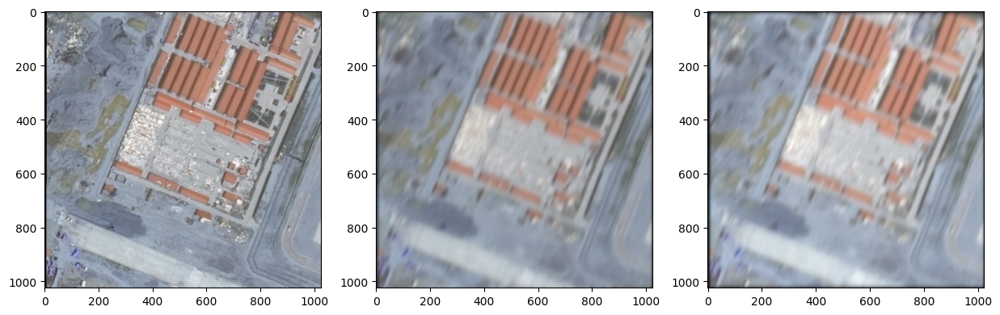

In [17]:
path_to_sample_image = "./sample_images/P0000_0000.png"
img = cv2.imread(path_to_sample_image)
img = cv2.resize(img, IMAGE_SIZE)

convolved_channels = []
fft_psf = np.fft.fft2(psf)

for channel in range(img.shape[-1]):
    fft_img = np.fft.fft2(img[:, :, channel])
    psf_img = np.abs(np.fft.ifftshift(np.fft.ifft2(fft_img * fft_psf)))
    convolved_channels.append(psf_img)

psf_img = np.stack(convolved_channels, axis=-1).astype(np.uint8)

fftconv_img = fftconvolve(img, psf[:, :, np.newaxis], "same")
fftconv_img = fftconv_img / np.max(fftconv_img)

print((img - psf_img).all() == 0)
print((fftconv_img - psf_img).all() == 0)

plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.subplot(1, 3, 2)
plt.imshow(psf_img / 255)
plt.subplot(1, 3, 3)
plt.imshow(fftconv_img)
plt.show()

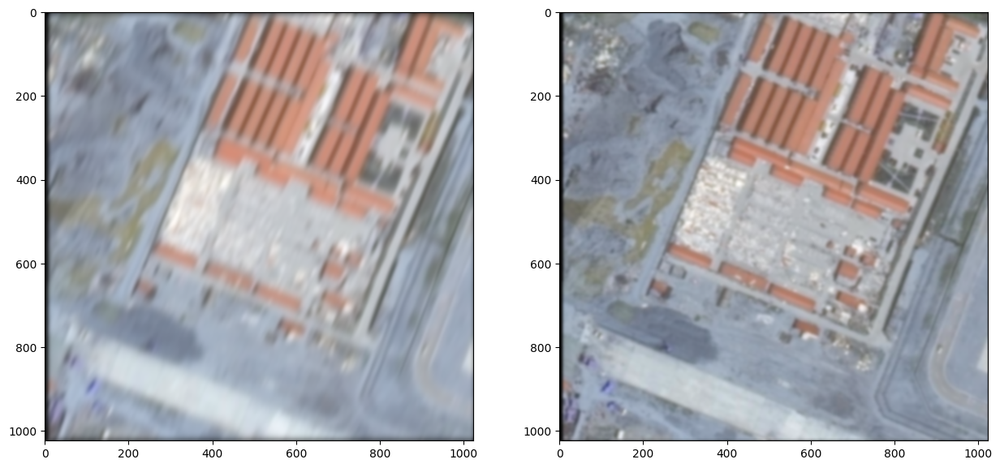

False


In [19]:
psf_2 = get_normal_psf_for_grid(grid=grid, sigma_x=10, sigma_y=10, eta=eta, mean_x=mean_x, mean_y=mean_y)

fftconv_img_1 = fftconvolve(img, psf[:, :, np.newaxis], "same")
fftconv_img_1 = fftconv_img_1 / np.max(fftconv_img_1)

fftconv_img_2 = fftconvolve(img, psf_2[:, :, np.newaxis], "same")
fftconv_img_2 = fftconv_img_2 / np.max(fftconv_img_2)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(fftconv_img_1)

plt.subplot(1, 2, 2)
plt.imshow(fftconv_img_2)

plt.show()

print((fftconv_img_1 - fftconv_img_2).all() == 0)

(205, 205, 3)


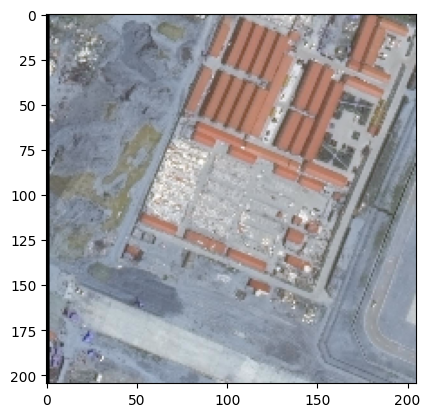

In [20]:
downsampled_img = img[::5, ::5, ::]
print(downsampled_img.shape)
plt.imshow(downsampled_img)
plt.show()

In [11]:
path_to_psf = "../psf/"

# sigma_x_list = [i for i in range(1, 6, 1)]
# sigma_y_list = [i for i in range(1, 6, 1)]

sigma_x_list = [5]
sigma_y_list = [5]

eta_list = np.random.randint(0, 365, 4)
eta_list = np.append(eta_list, [0])

for sigma_x in sigma_x_list:
    for sigma_y in sigma_y_list:
        for eta in eta_list:
            create_and_save_psf(save_dir_path=path_to_psf, grid=grid, sigma_x=sigma_x, sigma_y=sigma_y, eta=eta)

In [10]:
sigma_x_list = [10, 20, 50, 100]
sigma_y_list = [10, 20, 50, 100]

eta_list = np.random.randint(0, 365, 3)
eta_list = np.append(eta_list, [0])

for sigma_x in sigma_x_list:
    for sigma_y in sigma_y_list:
        for eta in eta_list:
            create_and_save_psf(save_dir_path=path_to_psf, grid=grid, sigma_x=sigma_x, sigma_y=sigma_y, eta=eta)

In [21]:
# create_and_save_psf(save_dir_path=os.path.join(path_to_psf, "1024"), grid=grid, sigma_x=5, sigma_y=5, eta=0)